# Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

# Camera calibration using chessboard images

In [2]:
%matplotlib qt

In [3]:
# Finding Corners
nx = 9
ny = 6

# prepare object points
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    # Read in each image
    img = mpimg.imread(fname)
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)  # for mpimg.imread

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        cv2.imshow('img',img)
        cv2.waitKey(500)

cv2.destroyAllWindows()

In [4]:
%matplotlib inline

---

# Image Processing

## 1. Correcting for Distortion

In [5]:
def cal_undistort(img, objpoints, imgpoints):
    """ This function takes an image, object points, and image points 
    performs the camera calibration, image distortion correction and 
    returns the undistorted image
    """
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)  # for mpimg.imread

    # Calibrate camera using object points, image points, and the shape of the grayscale image
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, 
                                    imgpoints, gray.shape[::-1], None, None)
    
    # Undistort the input image
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    # Return resulting image
    return undist

### Test on chessboard image

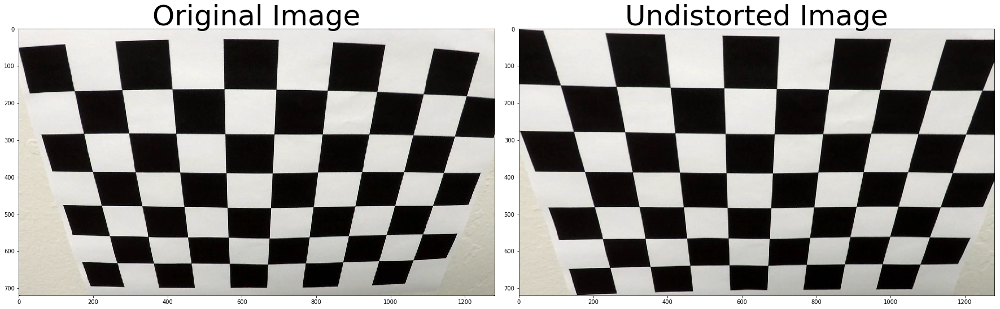

In [6]:
# Read in an image
img = mpimg.imread('./camera_cal/calibration2.jpg')

# Get undistorted image
undistorted = cal_undistort(img, objpoints, imgpoints)

# Plot results
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Test on road image

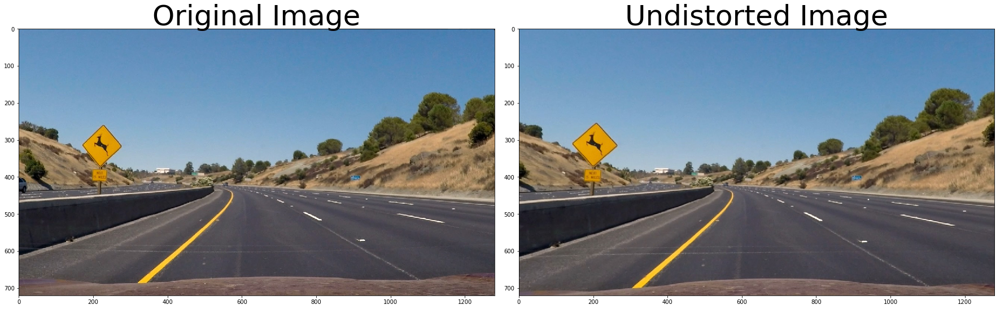

In [7]:
# Read in an image
img = mpimg.imread('./test_images/test2.jpg')

# Get undistorted image
undistorted = cal_undistort(img, objpoints, imgpoints)

# Plot results
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## 2. Thresholding

## Gradient threshold/Sobel Operator

### Absolute Sobel threshold

In [8]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    """""This function identifies pixels where the gradient of an image 
    falls within a specified threshold range "thresh" and returns the resulting
    binary image
    """""
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)  # for mpimg.imread
    
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
        
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    # Create a copy and apply the threshold
    grad_binary = np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # Return the result
    return grad_binary

### Test on image (x-direction)

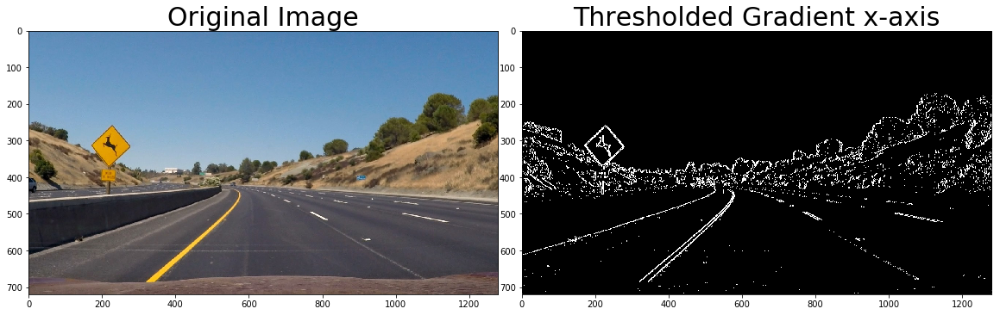

In [9]:
# Read in an image
img = mpimg.imread('./test_images/test2.jpg')

sobel_kernel = 3
thresh = (25, 255)

# Apply x-Sobel operator
grad_binary_im_x = abs_sobel_thresh(img,'x',sobel_kernel,thresh)

# Plot results
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(grad_binary_im_x, cmap='gray')
ax2.set_title('Thresholded Gradient x-axis', fontsize=30)

### Test on image (y-direction)

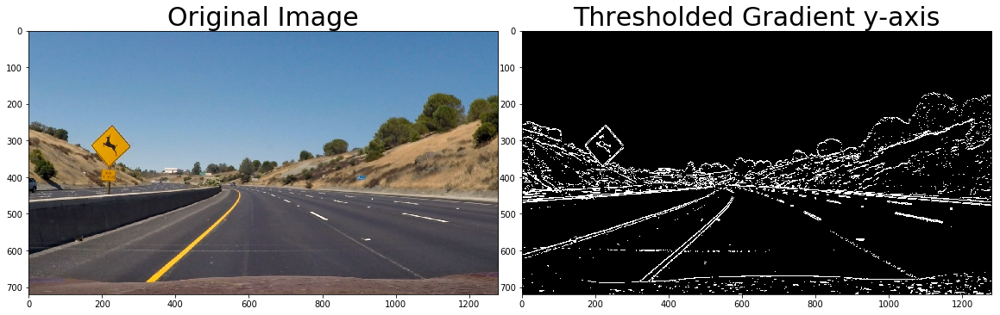

In [10]:
# Read in an image
img = mpimg.imread('./test_images/test2.jpg')

sobel_kernel = 3
thresh = (25, 255)

# Apply y-Sobel operator
grad_binary_im_y = abs_sobel_thresh(img,'y',sobel_kernel,thresh)

# Plot results
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(grad_binary_im_y, cmap='gray')
ax2.set_title('Thresholded Gradient y-axis', fontsize=30)

### Magnitude of the Gradient

In [11]:
def mag_thresh(image, sobel_kernel=3, mag_thresh=(0, 255)):
    """""This function applies a threshold "mag_thresh" to the overall magnitude of the gradient,
    in both x and y and returns the binary image"""""
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)  # for mpimg.imread
    
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255
    gradmag = (gradmag/scale_factor).astype(np.uint8)
    
    # Create a binary image of ones where threshold is met, zeros otherwise
    mag_binary = np.zeros_like(gradmag)
    mag_binary[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return mag_binary

### Test on image

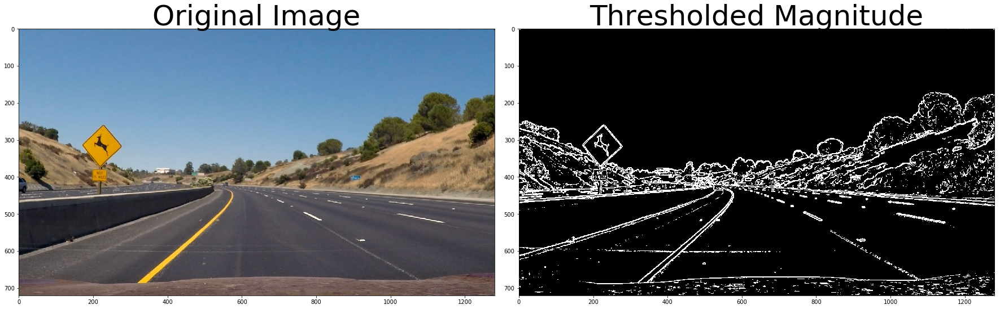

In [12]:
# Read in an image
img = mpimg.imread('./test_images/test2.jpg')

sobel_kernel = 3
thresh = (25, 255)

# Apply magnitude of the gradient function
mag_binary = mag_thresh(img, sobel_kernel, thresh)

# Plot results
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Direction of the Gradient

In [13]:
def dir_threshold(image, sobel_kernel=3, thresh=(0, np.pi/2)):
    """""This function computes the direction of the gradient, applies a threshold "thresh"
    and returns the binary image"""""
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)  # for mpimg.imread
    
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # Take the absolute value of the gradient direction,
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    dir_binary = np.zeros_like(absgraddir)
    dir_binary[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    
    # Return the binary image
    return dir_binary

### Test on image

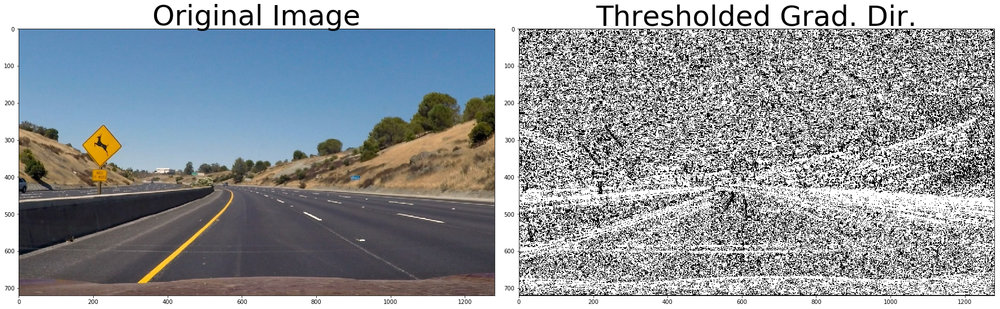

In [14]:
# Read in an image
img = mpimg.imread('./test_images/test2.jpg')

sobel_kernel = 3
thresh=(np.pi/4, np.pi/2)

# Apply the direction of the gradient function
dir_binary = dir_threshold(img, sobel_kernel, thresh)

# Plot results
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Combining thresholds

In [15]:
# Choose a Sobel kernel size
ksize = 3 # Choose a larger odd number to smooth gradient measurements

# Apply each of the thresholding functions
gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=ksize, thresh=(25, 255))
grady = abs_sobel_thresh(img, orient='y', sobel_kernel=ksize, thresh=(25, 255))
mag_binary = mag_thresh(img, sobel_kernel=ksize, mag_thresh=(25, 255))
dir_binary = dir_threshold(img, sobel_kernel=ksize, thresh=(np.pi/4, np.pi/2))

combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

### Test on image

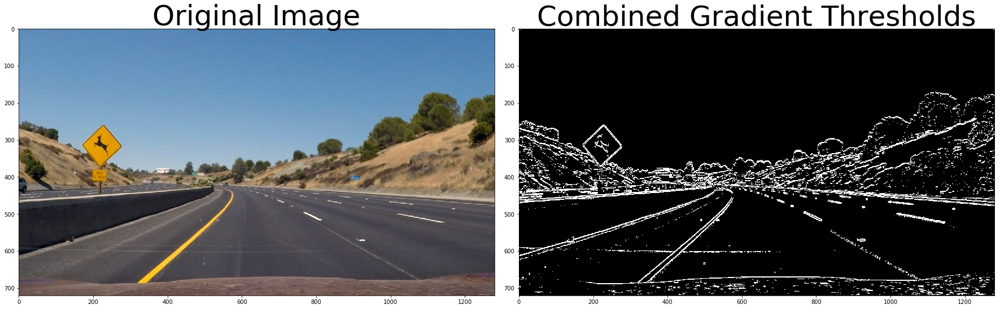

In [16]:
# Read in an image
img = mpimg.imread('./test_images/test2.jpg')

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(combined, cmap='gray')
ax2.set_title('Combined Gradient Thresholds', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## RGB Colorspace

In [17]:
def rgb_select(img, color_threshold):
    """""This function thresholds r-channel and g-channel of RGB color space
    and returns the respective condition"""""
    # Employ RGB threshold 
    r_channel = img[:,:,0]
    g_channel = img[:,:,1]
 
    r_g_condition = (r_channel > color_threshold) & (g_channel > color_threshold)
    
    return r_g_condition

## HLS Colorspace

In [18]:
def hls_select(img, s_thresh=(0, 255), l_thresh=(0, 255)):
    """""This function thresholds s-channel and l-channel of HLS color space
    and returns the respective condition"""""
    # Employ HLS threshold
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    l_channel = hls[:,:,1]

    s_condition = (s_channel > s_thresh[0]) & (s_channel <= s_thresh[1])
    l_condition = (l_channel > l_thresh[0]) & (l_channel <= l_thresh[1])

    return s_condition, l_condition

## All thresholds 

In [19]:
def all_thresholds(img):
    """""This function combines all thresholds: 
        * Gradient threshold (Sobel operator in x,y-directions, magnitude of the gradient, direction of the gradient)
        * RGB and HLS color space thresholds
        and returns the resulting binary image"""""
    # Choose Sobel kernel size
    ksize = 3 
    
    all_combined = np.zeros_like(img[:,:,0])  
    
    #### Gradient Sobel Thresholds ####
    
    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=ksize, thresh=(25, 255))
    grady = abs_sobel_thresh(img, orient='y', sobel_kernel=ksize, thresh=(25, 255))
    mag_binary = mag_thresh(img, sobel_kernel=ksize, mag_thresh=(25, 255))
    dir_binary = dir_threshold(img, sobel_kernel=ksize, thresh=(np.pi/4, np.pi/2))

    # Create a combined condition using the thresholding functions
    combined_sobel_condition = ((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))
    
    #### Color Space Thresholds ####
    
    # Employ RGB threshold to detect yellow lines
    r_g_condition = rgb_select(img, 150)

    # Employ HLS threshold to get conditions for s&l-channels
    s_condition, l_condition = hls_select(img, (100, 255), (120, 255))

    # Combine all conditions
    all_combined[(r_g_condition & l_condition) & (s_condition | combined_sobel_condition)] = 1
    
    return all_combined

### Test on image

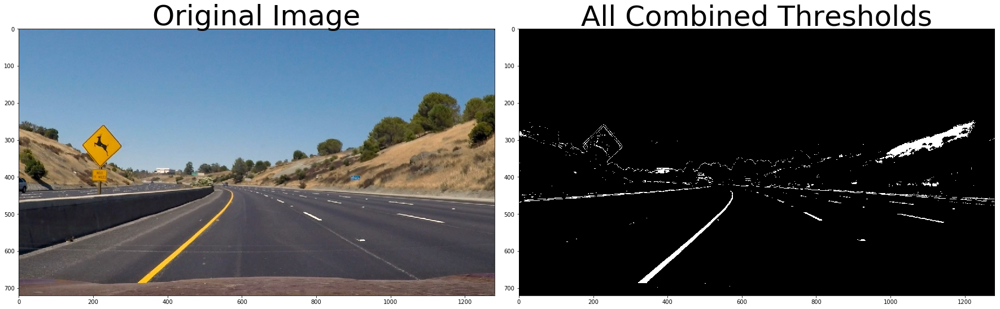

In [20]:
# Read in an image
img = mpimg.imread('./test_images/test2.jpg')

# Apply all thresholds and return binary image
thres_img = all_thresholds(img)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(thres_img, cmap='gray')
ax2.set_title('All Combined Thresholds', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Image Processing pipeline

In [21]:
def Image_Processing(img):
    """ This function gets an image and performs the following:
        * Camera calibration and undistrortion
        * Performs image thresholding (Sobel operator/Magnitude of gradient/Direction of gradient and Color thresholding)
        * Applies perspective transform"""
    
    # 1) Undistort using camera calibration matrix
    undistorted_img = cal_undistort(img, objpoints, imgpoints)
    
    # Get image height and width
    height = undistorted_img.shape[0]
    width = undistorted_img.shape[1]
    
    # 2) Perform image thresholding 
    combined_img = all_thresholds(undistorted_img)

    # 3) Apply the region of interest mask
    mask = np.zeros_like(combined_img)
    region_of_interest_vertices = np.array([[0,height-1], [width/2, int(0.5*height)], [width-1, height-1]], dtype=np.int32)
    cv2.fillPoly(mask, [region_of_interest_vertices], 1)
    masked_img = cv2.bitwise_and(combined_img, mask)
    
    # 4) Perform perspective transform (warp image)
    warped_img = warp_image(masked_img, src, dst)
    
    return warped_img

## 4. Perspective transform

### Auxiliary function: Draw Region of Interest

In [22]:
def draw_roi(img, pts=None):
    """ This function takes an image and points of interest
    and returns an image with a drawn region of interest
    """
    if pts is None:
        return    
    pts.reshape((-1,1,2))
    lines = np.zeros_like(img)
    cv2.polylines(lines, [pts], True, (255,0,0), 5)
    lined_img = cv2.addWeighted(img, 1.0, lines, 1.0, 5.)
    return lined_img

### Test on image

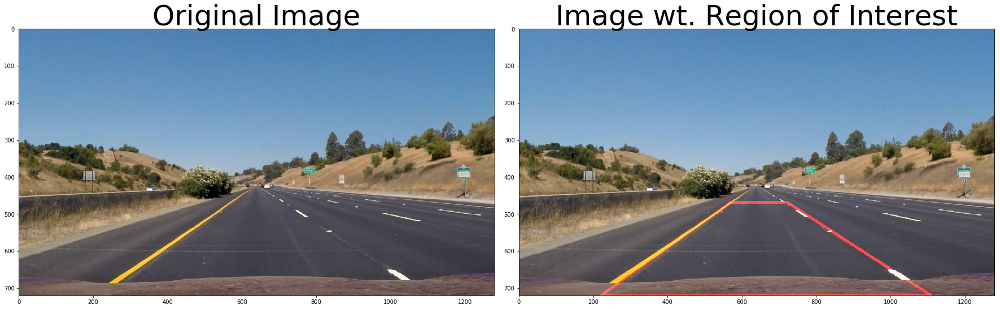

In [23]:
# Read in an image
img = mpimg.imread('./test_images/straight_lines1.jpg')

roi = np.int32([(0.564*img.shape[1],0.65*img.shape[0]),
                     (0.867*img.shape[1],img.shape[0]),
                     (0.172*img.shape[1],img.shape[0]),                   
                      (0.445*img.shape[1],0.65*img.shape[0])])

# Draw region of interest
test_img = draw_roi(img, roi)

# Plot results
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(test_img)
ax2.set_title('Image wt. Region of Interest', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Source and destination coordinates

In [24]:
# Source coordinates
src = np.float32([(0.564*img.shape[1],0.65*img.shape[0]),
                 (0.867*img.shape[1],img.shape[0]),
                 (0.172*img.shape[1],img.shape[0]),                   
                  (0.445*img.shape[1],0.65*img.shape[0])])
# Destination coordinates
dst = np.float32(([(0.8*img.shape[1],0),
          (0.8*img.shape[1],img.shape[0]), 
          (0.2*img.shape[1],img.shape[0]), 
          (0.2*img.shape[1],0)]))

### Perspective transform function

In [25]:
# Define perspective transform function
def warp_image(img, src, dst):
    """ This function takes an image, source and destination coordinates
    and performs the perspective transform to return a warped image
    """
    # Get the image size
    img_size = (img.shape[1], img.shape[0])
    
    # Typecast the source and destination coordinates to float32
    src = src.astype('float32')
    dst = dst.astype('float32')
    
    # Compute the perspective transform, M
    M = cv2.getPerspectiveTransform(src, dst)
    
    # Warp the image using OpenCV warpPerspective()
    warped_img = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    # Return resulting image
    return warped_img

### Test on image

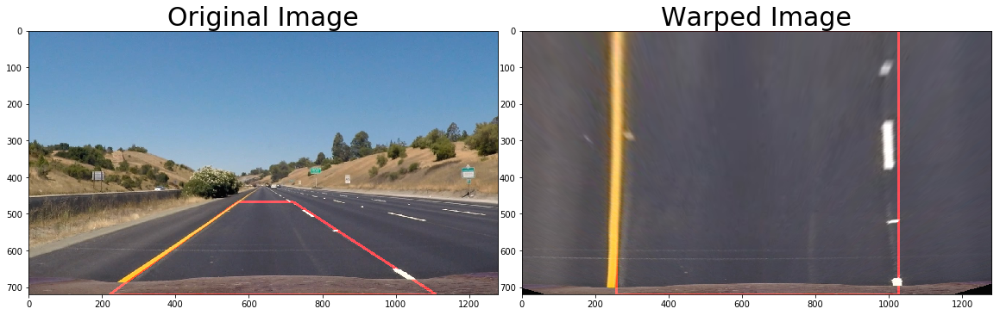

In [26]:
# Read in an image
img = mpimg.imread('./test_images/straight_lines1.jpg')

# Get image size
img_size = (img.shape[1], img.shape[0])

# Compute the inverse perspective transform by swapping the input parameters
Minv = cv2.getPerspectiveTransform(dst.astype('float32'), src.astype('float32'))

# Draw region of interest (defined by source coordinates)
img_roi = draw_roi(img, src.astype('int32'))

# Get perspective transform (warp image)
warped_im = warp_image(img, src, dst)
# Draw region of interest (defined by destination coordinates)
warped_im_roi = draw_roi(warped_im, dst.astype('int32'))

# Get inverse perspective transform (unwarp image to its original form)
unwarped_im = cv2.warpPerspective(warped_im, Minv, img_size, flags=cv2.INTER_LINEAR) 
# Draw region of interest (defined by source coordinates)
unwarped_im_roi = draw_roi(unwarped_im, src.astype('int32'))

# Plot results
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(img_roi)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(warped_im_roi)
ax2.set_title('Warped Image', fontsize=30)

# Lane line detection

### **Method:** Identify peaks in a Histogram and use Sliding Window

In [27]:
def find_lane_lines_ini(binary_warped_img):
    """ This function takes a warped image in binary form, implements
    Sliding Window technique to find the lane lines and fits a second 
    order polynomial to each one of them"""
    
    # Given a warped binary image take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped_img[int(binary_warped_img.shape[0]/2):,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped_img, binary_warped_img, binary_warped_img))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped_img.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped_img.shape[0] - (window+1)*window_height
        win_y_high = binary_warped_img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    return left_fit, right_fit

### **Method:** Search in a margin around the previous line positions

In [28]:
def find_lane_lines(binary_warped_img, left_fit, right_fit):
    """ This function takes a warped image in binary form, previous left
    and right lines, searches in a margin around the previous line positions
    and fits a second order polynomial to each one of them"""
    
    # Given a new warped binary image from the next frame of video
    nonzero = binary_warped_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    return left_fit, right_fit

# Lane curvature calculation

In [29]:
def calc_curvature(img, l_fit, r_fit):
    """ This function calculates the curvature of the lane """
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Get image shape
    h,w = img.shape
    
    # Generate lane lines
    ploty, left_fitx, right_fitx = gen_lane_lines(l_fit, r_fit, img)
    # Define y-value where we want radius of curvature
    # We choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    if len(left_fitx) != 0 and len(right_fitx) != 0:
        
        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)

        # Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])

        # Calculate average curvature of the two lanes
        average_curve_rad = (left_curverad + right_curverad)/2
        
        # Find lane center
        lane_center = (left_fitx[-1] + right_fitx[-1])/2
        
        # Calculate center offset
        center_offset_pixels = abs(w/2 - lane_center)
        center_offset_mtrs = xm_per_pix*center_offset_pixels
        
    return average_curve_rad, center_offset_mtrs

# Lane area drawing

In [30]:
def gen_lane_lines(left_fit, right_fit, img):
    """ This function generates and returns the lane lines for plotting """
    # Generate x and y values for plotting
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    return ploty, left_fitx, right_fitx

In [31]:
def draw_lane_area(original_img, binary_img, l_fit, r_fit, Minv):
    """ This function drawns the lane area """
    if l_fit is None or r_fit is None:
        return original_img
    
    # Create a new image to draw the results on
    new_img = np.copy(original_img)
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    h,w = binary_img.shape
    # Generate x and y values for plotting
    ploty, left_fitx, right_fitx = gen_lane_lines(l_fit, r_fit, binary_img)

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), [0,255, 0])
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)
    
    # Compute the inverse perspective transform by swapping the input parameters
    newwarp = cv2.warpPerspective(color_warp, Minv, (w, h)) 
    
    # Combine the result with the original image
    result = cv2.addWeighted(new_img, 1, newwarp, 0.5, 0)
        
    return result

### Test on image 

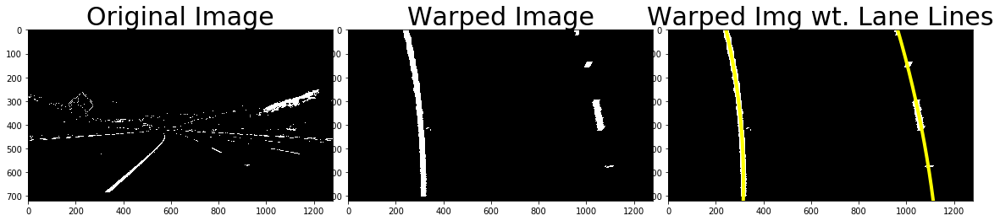

In [32]:
# Use combined threshold image from previous session
img = thres_img

# Define region of interest
img_roi = draw_roi(img, src.astype('int32'))

# Get perspective transform
warped_im = warp_image(img, src, dst)
warped_im_roi = draw_roi(warped_im, dst.astype('int32'))

# Find lane lines using peaks in a histogram & sliding window
left_fit, right_fit = find_lane_lines_ini(warped_im)

# Generate and return the lane lines for plotting
ploty, left_fitx, right_fitx = gen_lane_lines(left_fit, right_fit, img)

# Plot results
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(img, cmap='gray')
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(warped_im, cmap='gray')
ax2.set_title('Warped Image', fontsize=30)
ax3.imshow(warped_im, cmap='gray')
ax3.plot(left_fitx, ploty, linewidth=4, color='yellow')
ax3.plot(right_fitx, ploty, linewidth=4, color='yellow')
ax3.set_title('Warped Img wt. Lane Lines', fontsize=30)

# Lane data printing

In [33]:
def print_lane_data(img, curv_rad, center_dist):
    """ This function prints the lane data (curve radius, off-center distance)"""
    # Create a new image to write the lane data
    new_img = np.copy(img)
    
    # Get image shape
    h = new_img.shape[0]
    
    # Choose text font
    font = cv2.FONT_HERSHEY_DUPLEX
    
    # Create text for curvature
    text = 'Curve radius: ' + '{:04.2f}'.format(curv_rad) + 'm'
    # Use cv2.putText to "draw" text into image
    cv2.putText(new_img, text, (40,70), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    
    # Condition for off-center distance (right or left of center)
    direction = ''
    if center_dist > 0:
        direction = 'right'
    elif center_dist < 0:
        direction = 'left'
    abs_center_dist = abs(center_dist)
    
    # Create text for off-center distance
    text = '{:04.3f}'.format(abs_center_dist) + 'm ' + direction + ' of center'
    # Use cv2.putText to "draw" text into image
    cv2.putText(new_img, text, (40,120), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    
    # Return image
    return new_img    

---

# Final Pipeline

In [34]:
def Final_Pipeline(img):
    """ This function performs the following:
    * Image Processing (function `Image_Processing()`)
        1. Undistorts using camera calibration matrix (function `cal_undistort()`)
        2. Applies thresholding functions combination
            - Gradient threshold (Sobel operator in x,y-directions, magnitude of the gradient, direction of the gradient)
            - RGB and HLS color space thresholds
        3. Applies region of interest mask
        4. Performs perspective transform ( function `warp_image()`)
    * Lane line detection (functions `find_lane_lines_ini(), find_lane_lines()`)
    * Lane curvature calculation (function `calc_curvature()`)
    * Lane area drawing (function `draw_lane_area()`)
    * Lane data printing (function `print_lane_data()`)
    and returns the resulting image.
    """
    # Compute the inverse perspective transform
    Minv = cv2.getPerspectiveTransform(dst.astype('float32'),src.astype('float32'))
    
    # Perform the Image_Processing pipeline on the input image to produce a binary image
    img_bin = Image_Processing(img)
    
    # If the l_list, r_list lists are empty (the first time the pipelines runs)
    # run the "find_lane_lines_ini" function that uses peaks in a histogram 
    # & sliding window
    if (not l_list) and (not r_list):
        lf, rf = find_lane_lines_ini(img_bin)
        l_list.append(lf)
        r_list.append(rf)
    # Else use the function "find_lane_lines" that uses previous left
    # and right lines to find the next ones
    else:
        lf, rf = find_lane_lines(img_bin, l_list[-1], r_list[-1])
        l_list.append(lf)
        r_list.append(rf)        
    
    # Calculate curvature
    curv_rad, center_dist = calc_curvature(img_bin, lf, rf)
    
    # Draw lane area
    fin_img = draw_lane_area(img, img_bin, lf, rf, Minv) 
    
    # Print lane data on image
    fin_img = print_lane_data(fin_img, curv_rad, center_dist)

    # Return resulting image
    return fin_img

## Test pipeline on images

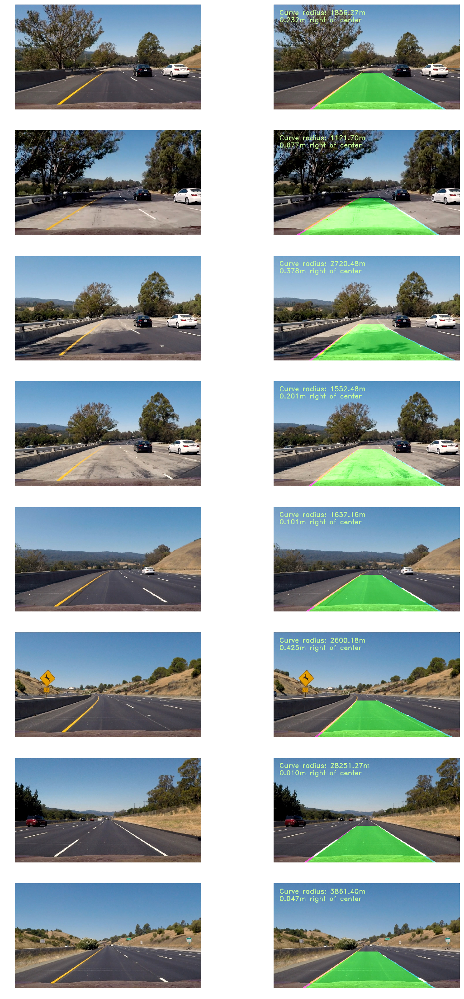

In [35]:
# Make a list of example images
images = glob.glob('./test_images/*.jpg')
                                          
# Set up plot
fig, axs = plt.subplots(len(images),2, figsize=(20, 40))
fig.subplots_adjust(hspace = .2, wspace=.05)
axs = axs.ravel()

# Create empty lists to save the left and right lane lines
l_list = []
r_list = []
                  
i = 0
# Iterate through all the images
for image in images:
    img = mpimg.imread(image)
    fin_img = Final_Pipeline(img)
    axs[i].imshow(img)
    axs[i].axis('off')
    i += 1
    axs[i].imshow(fin_img)
    axs[i].axis('off')
    i += 1
    
l_list = []
r_list = []

## Test pipeline on video

In [36]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [37]:
white_output = './output_video/project_video.mp4'
 
clip1 = VideoFileClip("./project_video.mp4")

# Create empty lists to save the left and right lane lines
l_list = []
r_list = []

white_clip = clip1.fl_image(Final_Pipeline) 
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video ./output_video/project_video.mp4
[MoviePy] Writing video ./output_video/project_video.mp4


100%|█████████▉| 1260/1261 [21:53<00:00,  1.02it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./output_video/project_video.mp4 

CPU times: user 20min 53s, sys: 1min 20s, total: 22min 13s
Wall time: 21min 55s
